## Декомпозиция метрик. Срезы

Вопрос «Почему метрика упала?» аналитик слышит едва ли не чаще, чем дежурное «Коллеги, как дела?» в начале созвона.   

Этот ноутбук посвящён базовым подходам, которые помогают закрывать такие вопросы.

In [1]:
import pandas as pd
import numpy as np
from datetime import datetime
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go

import warnings
warnings.filterwarnings('ignore')

In [2]:
def get_line_plot(df, x, y, title, annotate=False):
    fig, ax1 = plt.subplots(figsize=(12,6))
    
    if len(y) == 2:
        ax1.plot(df[x], df[y[0]], label=y[0], color='blue')
        ax1.set_ylabel(y[0])

        plt.xticks(rotation=45)

        if annotate:
            for i, val in enumerate(df[y[0]]):
                ax1.text(df[x].iloc[i], val, f'{val:.2f}', fontsize=9)

        ax2 = ax1.twinx()
        ax2.plot(df[x], df[y[1]], label=y[1], color='green')
        ax2.set_ylabel(f'{y[1]}')
        ax2.tick_params(axis='y')

        if annotate:
            for i, val in enumerate(df[y[1]]):
                ax2.text(df[x].iloc[i], val, f'{val:.2f}', fontsize=9)

        lines, labels = ax1.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax1.legend(lines + lines2, labels + labels2,
                   loc='center left', bbox_to_anchor=(1.05, 0.8))

        ax1.grid(True, which='both')
        fig.suptitle(title)
        fig.tight_layout()
        
        return plt.show()

    else:
        for col in y:
            plt.plot(df[x], df[col], label=col, color='blue')

            if annotate:
                for i, val in enumerate(df[col]):
                    plt.text(df[x].iloc[i], val, f'{val:.2f}', fontsize=9)

        plt.title(title)
        plt.xlabel('Date')
        plt.ylabel('Metric Value')
        plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.8))
        plt.grid(True)
        plt.xticks(rotation=45)
        plt.tight_layout()

    return plt.show()

In [3]:
def get_several_lines_plot(df, x, y_list, title):
    plt.figure(figsize=(12,6))
    colors = ['green', 'blue', 'orange', 'pink', 'violet']
    
    for i, col in enumerate(y_list):
        if x == 'date':
            x_axis = df[x]
        else:
            x_axis = df[x].astype(str)

        y_axis = df[col]
        plt.plot(x_axis, y_axis, label=col, color=colors[i])

        for xi, yi in zip(x_axis, y_axis):
            plt.text(xi, yi, f'{yi:.2f}', fontsize=9, ha='center', va='bottom')

    plt.title(title)
    plt.xlabel('Date')
    plt.xticks(rotation=45)
    plt.ylabel('Metric Value')
    
    plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.9))
    
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [4]:
def get_heatmap(df, x, y_list, y_label, title):
    data = df.set_index(x)[y_list].T
    
    plt.figure(figsize=(14, len(y_list)*0.5 + 2))
    sns.heatmap(data, annot=True, fmt='.2f', cmap='coolwarm')
    plt.title(title)
    plt.ylabel(y_label)
    plt.xlabel(x)
    plt.yticks(rotation=0)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [5]:
def get_category_plot(df, x_col, metric, cal_column, title):
    
    plt.figure(figsize=(12,6))
    
    for cat in df[cal_column].unique():
        temp = df[df[cal_column] == cat]
        plt.plot(temp[x_col], temp[metric], label=cat)
        
        for x, y in zip(temp[x_col], temp[metric]):
            plt.text(x, y, f'{y:.2f}', ha='center', va='bottom', fontsize=8)
    
    plt.title(title)
    plt.xlabel(x_col)
    plt.ylabel(metric)
    plt.xticks(rotation=45)
    plt.grid(True)
    
    plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.9))
    
    plt.tight_layout()
    plt.show()

In [6]:
def get_stacked_area_plot(df, x_col, share_col, cat_col, title, annotate=True):
    df_c = df[[x_col, cat_col, share_col]].copy()
    
    pivot = (df_c.pivot(index=x_col, columns=cat_col, values=share_col)
                .fillna(0.0)
                .sort_index())
    
    pivot.index = pd.to_datetime(pivot.index)
    
    colors = sns.color_palette('Set2', n_colors=len(pivot.columns))
    ax = pivot.plot(kind='area', stacked=True, figsize=(12, 6), color=colors)

    plt.xticks(rotation=45)
    plt.title(title)
    plt.xlabel(x_col)
    plt.ylabel('Share')
    plt.grid(True, axis='y', linestyle=':')

    if annotate:
        cum = pivot.cumsum(axis=1)
        for t in pivot.index:
            for col, color in zip(pivot.columns, colors):
                share = float(pivot.at[t, col])
                if share <= 0:
                    continue
                y_center = float(cum.at[t, col] - share / 2.0)
                ax.annotate(f'{share:.2%}',
                            xy=(t, y_center),
                            xytext=(0, 0), textcoords='offset points',
                            ha='center', va='center',
                            fontsize=7)

    plt.legend(loc='center left', bbox_to_anchor=(1.05, 0.9))
    plt.tight_layout()
    plt.show()

### Дерево метрик

Пожалуй, самое простое, что приходит на ум — разложить метрику на составляющие. Если в компании составлено дерево метрик — считайте, задача решена. Это ваша готовая шпаргалка.

<img src="https://i.ibb.co.com/C5gMGW82/Ecom-Metric-Tree.jpg" width="500" align="center">

In [7]:
df_ecom_by_week = pd.read_csv('data/df_ecom_by_week.csv')

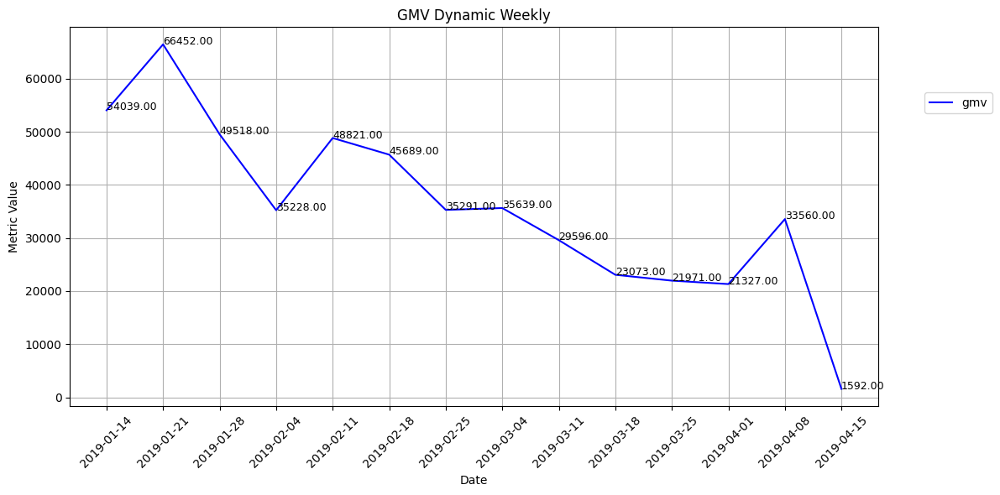

In [8]:
get_line_plot(df_ecom_by_week, 'week', ['gmv'], 'GMV Dynamic Weekly', annotate=True)

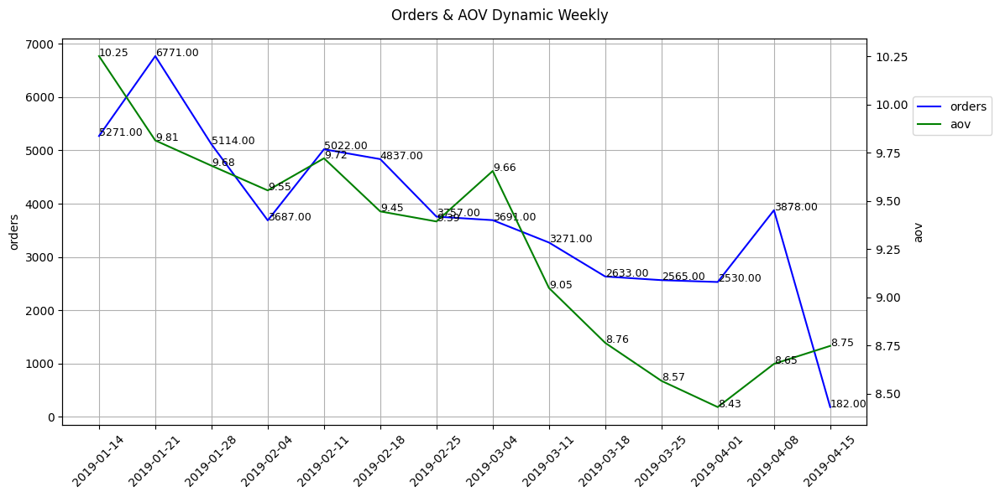

In [9]:
get_line_plot(df_ecom_by_week, 'week', ['orders', 'aov'], 'Orders & AOV Dynamic Weekly', annotate=True)

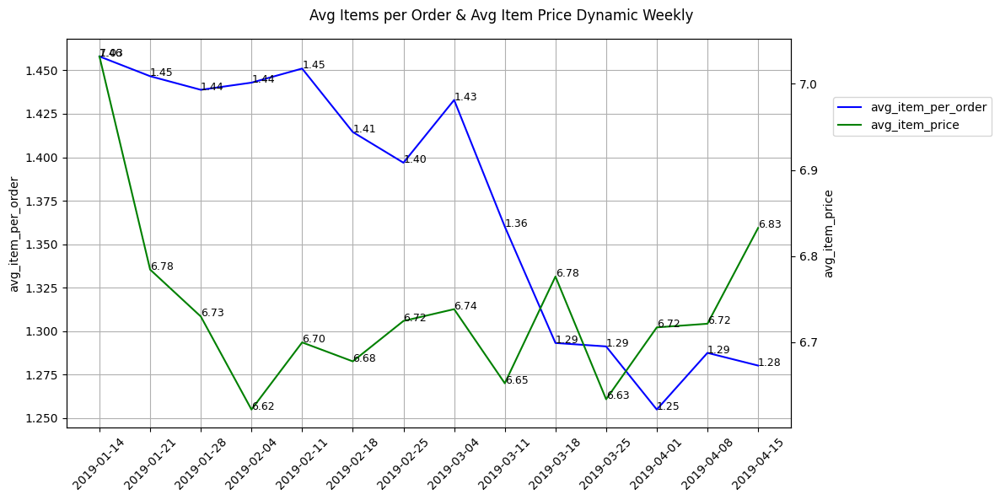

In [10]:
get_line_plot(df_ecom_by_week, 'week', ['avg_item_per_order', 'avg_item_price'], 
              'Avg Items per Order & Avg Item Price Dynamic Weekly', annotate=True)

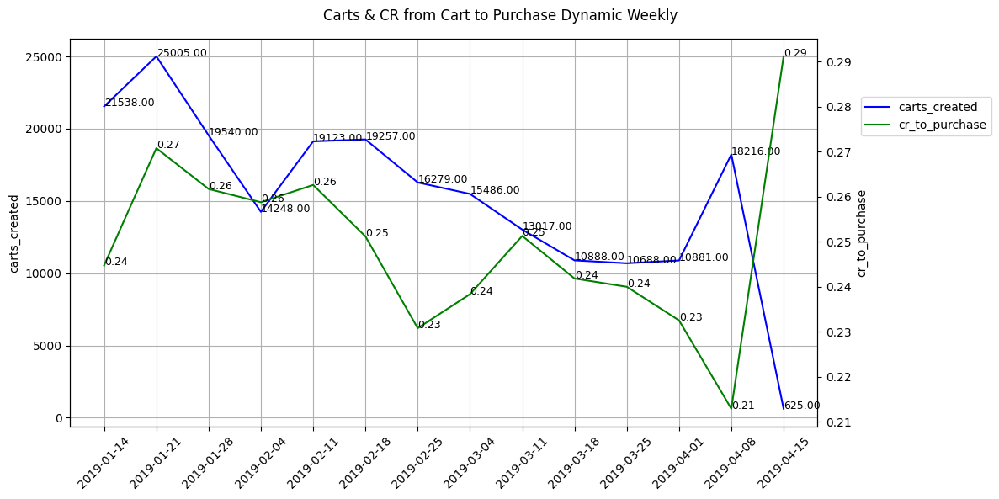

In [11]:
get_line_plot(df_ecom_by_week, 'week', ['carts_created', 'cr_to_purchase'], 
              'Carts & CR from Cart to Purchase Dynamic Weekly', annotate=True)

### Воронка

Сквозные конверсии полезно раскладывать по этапам воронки. В отличие от дерева метрик, которое показывает связи между показателями на уровне бизнеса, воронка фокусируется на последовательности действий и помогает локализовать проблему внутри пользовательского пути.
 
<img src="https://i.ibb.co.com/wD7VJzX/Funnel.jpg" width="300" align="center">

In [12]:
df_ecom_funnel_by_week = pd.read_csv('data/df_ecom_funnel_by_week.csv')

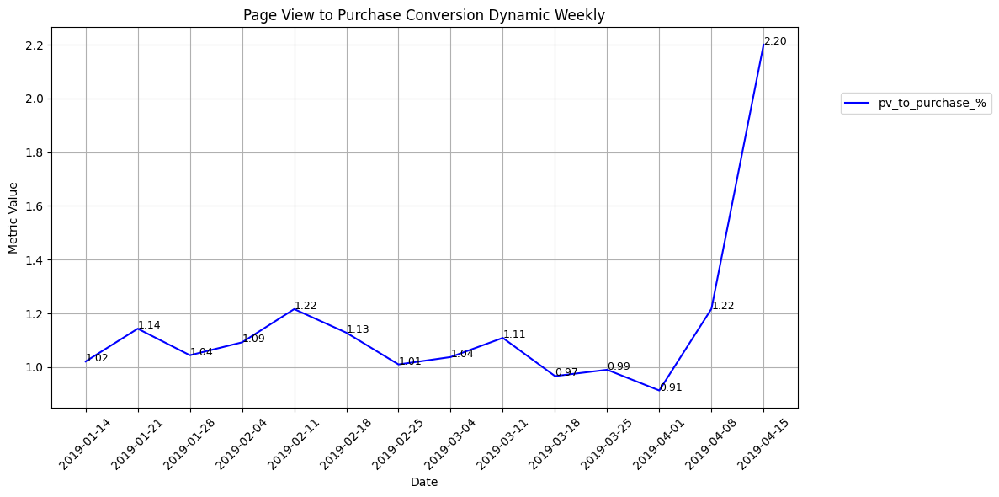

In [13]:
get_line_plot(df_ecom_funnel_by_week, 'week', ['pv_to_purchase_%'], 
              'Page View to Purchase Conversion Dynamic Weekly', annotate=True)

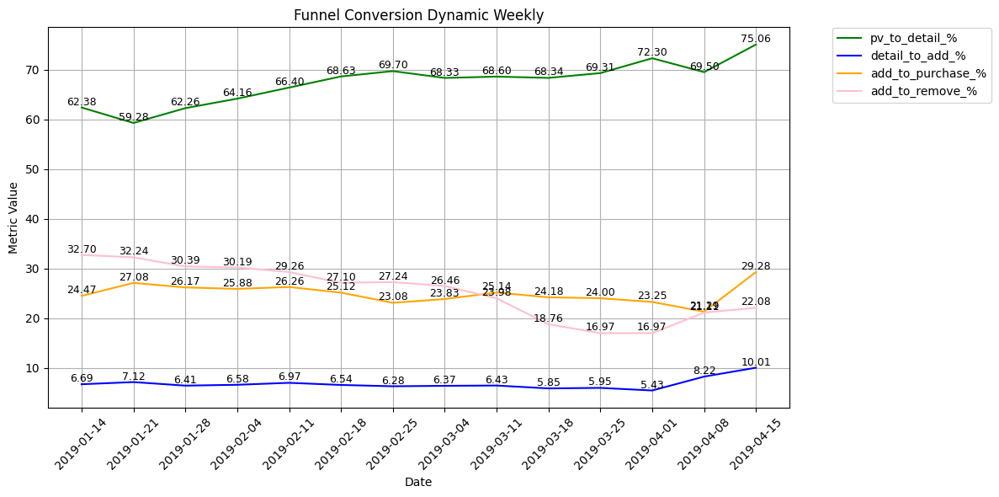

In [14]:
get_several_lines_plot(df_ecom_funnel_by_week, 'week',  ['pv_to_detail_%', 'detail_to_add_%', 'add_to_purchase_%', 'add_to_remove_%'], 
                       'Funnel Conversion Dynamic Weekly')

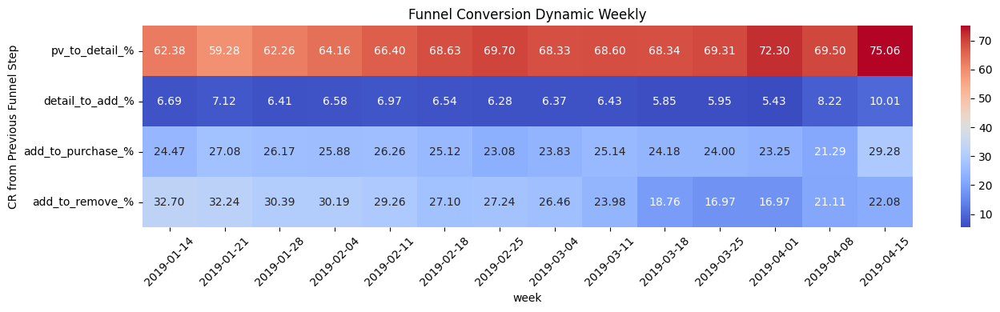

In [15]:
get_heatmap(df_ecom_funnel_by_week, 'week', ['pv_to_detail_%', 'detail_to_add_%', 'add_to_purchase_%', 'add_to_remove_%'],
            'CR from Previous Funnel Step', 'Funnel Conversion Dynamic Weekly')

### Методы декомпозиции

Когда мы определили метрики, повлиявшие на итоговое изменение, начинается самое интересное — оценить вклад каждого фактора. Для этого применяются методы декомпозиции. Они строятся на сравнении периодов и позволяют количественно разложить разницу. 

В ноутбуке мы посмотрим на пример Month-over-Month (MoM).

#### Right/left decomposition

$$
GMV = AOV \times Orders
$$

Поскольку мы получаем метрику GMV, через произведение, в геометрическом смысле ее можно представить как прямоугольник.

<img src="https://maxhalford.github.io/img/blog/kpi-evolution-decomposition/sum-right-left.png" width="400" align="center">

А значит изменение метрики во времени можно представить в виде формулы:

$$
GMV_{t+1} = GMV_t \;+\; Orders_t \times \Delta AOV \;+\; \Delta Orders \times AOV_{t+1}
$$

*[Source](https://maxhalford.github.io/blog/kpi-evolution-decomposition): Max Halford, Answering "Why did the KPI change?" using decomposition*

In [16]:
df_ecom_by_month = pd.read_csv('data/df_ecom_by_month.csv')

In [17]:
df_ecom_by_month['month'] = pd.to_datetime(df_ecom_by_month['month'])

In [18]:
df_ecom_by_month['aov_lag'] = df_ecom_by_month['aov'].shift(1)
df_ecom_by_month['orders_lag'] = df_ecom_by_month['orders'].shift(1)
df_ecom_by_month['gmv_lag'] = df_ecom_by_month['gmv'].shift(1)

In [19]:
df_ecom_by_month['gmv_MoM'] = df_ecom_by_month.gmv - df_ecom_by_month.gmv_lag
df_ecom_by_month['aov_contribution_rl'] = df_ecom_by_month.orders_lag * (df_ecom_by_month.aov - df_ecom_by_month.aov_lag)
df_ecom_by_month['orders_contribution_rl'] = df_ecom_by_month.aov * (df_ecom_by_month.orders - df_ecom_by_month.orders_lag)

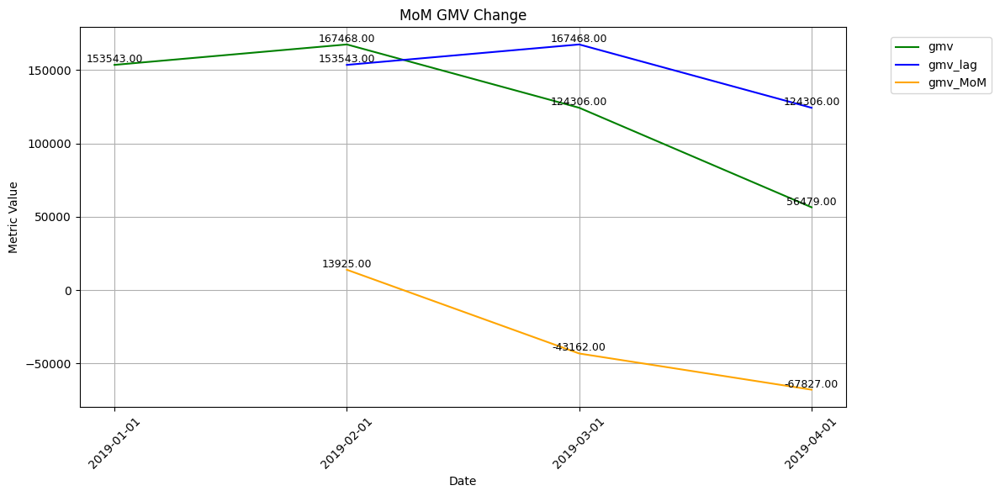

In [20]:
get_several_lines_plot(df_ecom_by_month, 'month',  ['gmv', 'gmv_lag', 'gmv_MoM'], 'MoM GMV Change')

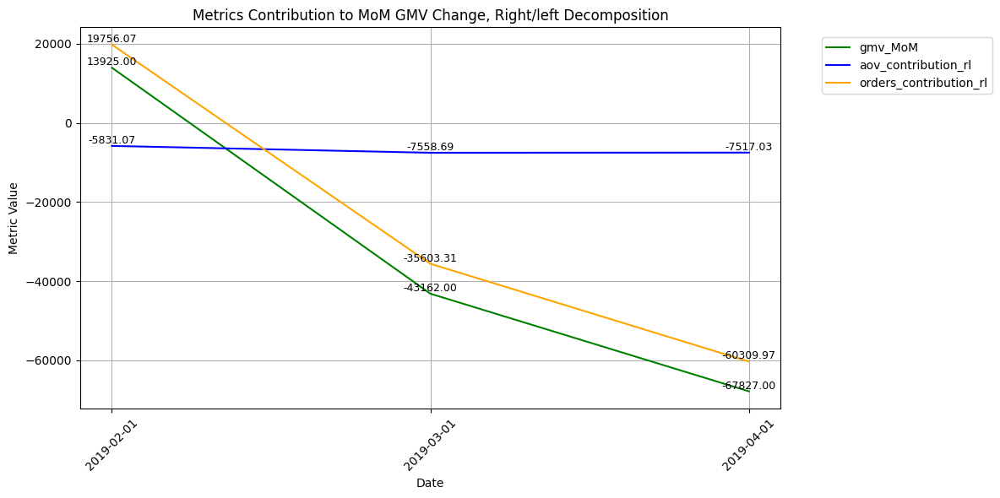

In [21]:
get_several_lines_plot(df_ecom_by_month[df_ecom_by_month['month'] > pd.Timestamp(2019, 1, 1)], 
                       'month',  ['gmv_MoM', 'aov_contribution_rl', 'orders_contribution_rl'], 
                       'Metrics Contribution to MoM GMV Change, Right/left Decomposition')

#### Left/right decomposition

Разделить прямоугольники на прошлом шаге можно было по-другому:

<img src="https://maxhalford.github.io/img/blog/kpi-evolution-decomposition/sum-left-right.png" width="400" align="center">

 
$$
GMV_{t+1} = GMV_t \;+\; AOV_t \times \Delta Orders \;+\; \Delta AOV \times Orders_{t+1}
$$

*[Source](https://maxhalford.github.io/blog/kpi-evolution-decomposition): Max Halford, Answering "Why did the KPI change?" using decomposition*

In [22]:
df_ecom_by_month['aov_contribution_lr'] = df_ecom_by_month.orders * (df_ecom_by_month.aov - df_ecom_by_month.aov_lag)
df_ecom_by_month['orders_contribution_lr'] = df_ecom_by_month.aov_lag * (df_ecom_by_month.orders - df_ecom_by_month.orders_lag)

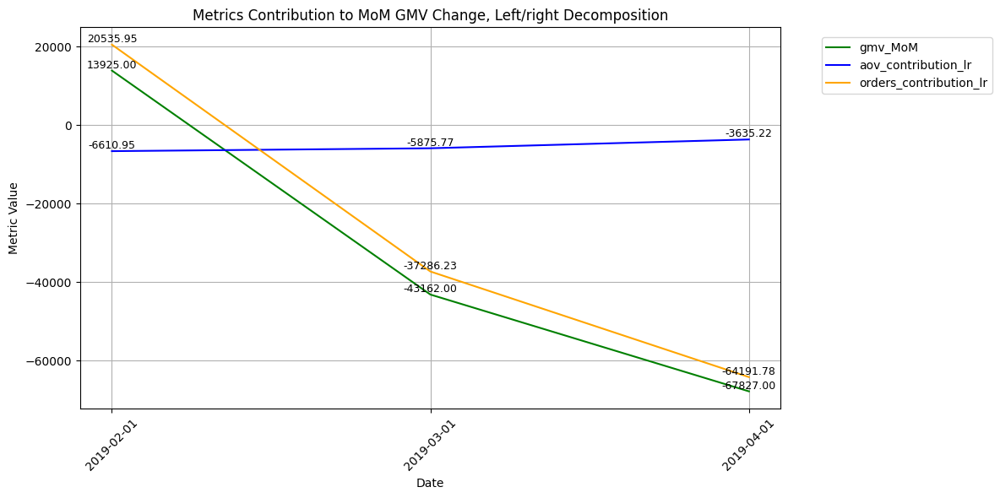

In [23]:
get_several_lines_plot(df_ecom_by_month[df_ecom_by_month['month'] > pd.Timestamp(2019, 1, 1)], 
                       'month',  ['gmv_MoM', 'aov_contribution_lr', 'orders_contribution_lr'], 
                       'Metrics Contribution to MoM GMV Change, Left/right Decomposition')

#### Conjugate decomposition (сопряженная декомпозиция)

Тогда почему бы нам не продолжать резать наш прямоугольник?

<img src="https://maxhalford.github.io/img/blog/kpi-evolution-decomposition/sum-conjugate.png" width="400" align="center">

 
$$
GMV_{t+1} = GMV_t \;+\; \Delta Orders \times AOV_t \;+\; \Delta AOV \times Orders_t \;+\; \Delta Orders \times \Delta AOV
$$

*[Source](https://maxhalford.github.io/blog/kpi-evolution-decomposition): Max Halford, Answering "Why did the KPI change?" using decomposition*

In [24]:
df_ecom_by_month['aov_contribution_conj'] = df_ecom_by_month.orders_lag * (df_ecom_by_month.aov - df_ecom_by_month.aov_lag)
df_ecom_by_month['orders_contribution_conj'] = df_ecom_by_month.aov_lag * (df_ecom_by_month.orders - df_ecom_by_month.orders_lag)
df_ecom_by_month['aov_x_orders_contribution_conj'] = (df_ecom_by_month.aov - df_ecom_by_month.aov_lag) * (df_ecom_by_month.orders - df_ecom_by_month.orders_lag)

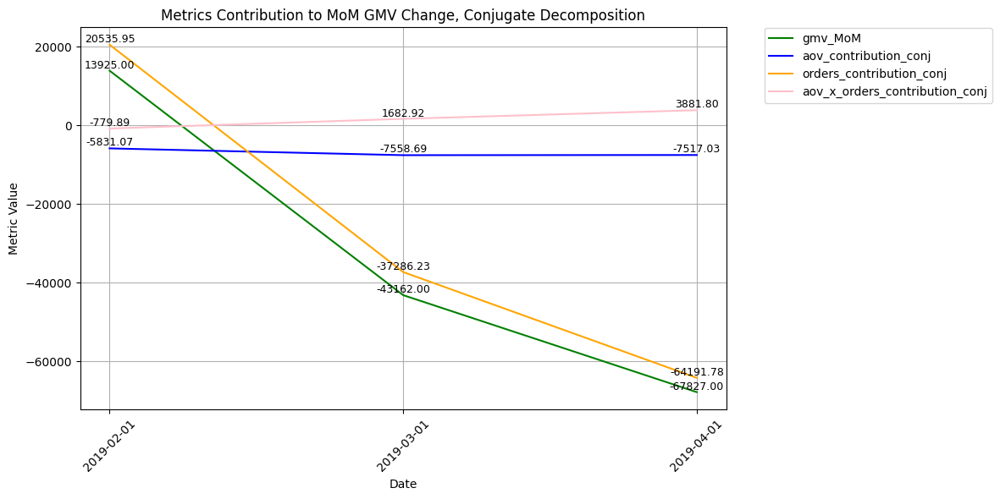

In [25]:
get_several_lines_plot(df_ecom_by_month[df_ecom_by_month['month'] > pd.Timestamp(2019, 1, 1)], 
                       'month',  ['gmv_MoM', 'aov_contribution_conj', 'orders_contribution_conj', 'aov_x_orders_contribution_conj'], 
                       'Metrics Contribution to MoM GMV Change, Conjugate Decomposition')

In [26]:
period = pd.Timestamp(2019, 3, 1)

df_ecom_by_month_period = df_ecom_by_month[df_ecom_by_month['month'] == period]

gmv_lag = round(df_ecom_by_month_period.gmv_lag.item(), 2)
aov_contrib = round(df_ecom_by_month_period.aov_contribution_conj.item(), 2)
orders_contrib = round(df_ecom_by_month_period.orders_contribution_conj.item(), 2)
interaction_contrib = round(df_ecom_by_month_period.aov_x_orders_contribution_conj.item(), 2)
gmv_curr = round(gmv_lag + aov_contrib + orders_contrib + interaction_contrib, 2)

In [27]:
fig = go.Figure(go.Waterfall(
    name = 'GMV decomposition',
    orientation = 'v',
    measure = ['absolute', 'relative', 'relative', 'relative', 'total'],
    x = ['GMV_prev', 'AOV effect', 'Orders effect', 'Interaction', 'GMV_curr'],
    textposition = 'outside',
    text = [gmv_lag, aov_contrib, orders_contrib, interaction_contrib, gmv_curr],
    y = [gmv_lag, aov_contrib, orders_contrib, interaction_contrib, gmv_curr],
    connector = {'line':{'color':'rgb(63, 63, 63)'}}
))

fig.update_layout(title='Waterfall decomposition of GMV (MoM)')
fig.show()

Waterfall хорошо подходит для разделения внешних эффектов и усилий самой продуктовой команды. Вы можете декомпозировать итоговый бизнес показатель на сквозную конверсию, как на непосредственно создаваемые командой эффекты внутри продукта, и входной трафик до точки контакта с вашим участком продукта — как внешний, независящий от вас фактор (если вы, конечно, не Маркетинг).

### Срезы (slices, dimensions, breakdowns)

Группировка метрик по срезам также может помочь ответить на вопрос об изменении, но другим способом — давая аналитику контекст.  
Если при декомпозиции мы раскладываем показатель на его математические составляющие, то срезы показывают, как метрика ведёт себя в разных сегментах.  

Общая метрика, рассчитанная на всём объёме данных, при гетерогенности теряет смысл — внутри отдельных срезов она может демонстрировать разные тренды. Таким образом, срезы позволяют выявлять скрытую неоднородность и находить сегменты, которые вносят наибольший вклад в изменения метрик.

Наиболее популярные срезы: 
- Гео
- Платформа
- Устройсто
- Версия приложения
- Категория товара
- Источник / тип трафика
- Сегмент пользователя (new / retained / returned)
- Возраст пользователя продукте
- День недели / час

Срез — это атрибут единицы расчета метрики, поэтому не все срезы применимы ко всем метрикам.

In [28]:
df_ecom_by_category_by_week = pd.read_csv('data/df_ecom_by_category_by_week.csv')
df_ecom_by_category_by_week['week'] = pd.to_datetime(df_ecom_by_category_by_week['week'])

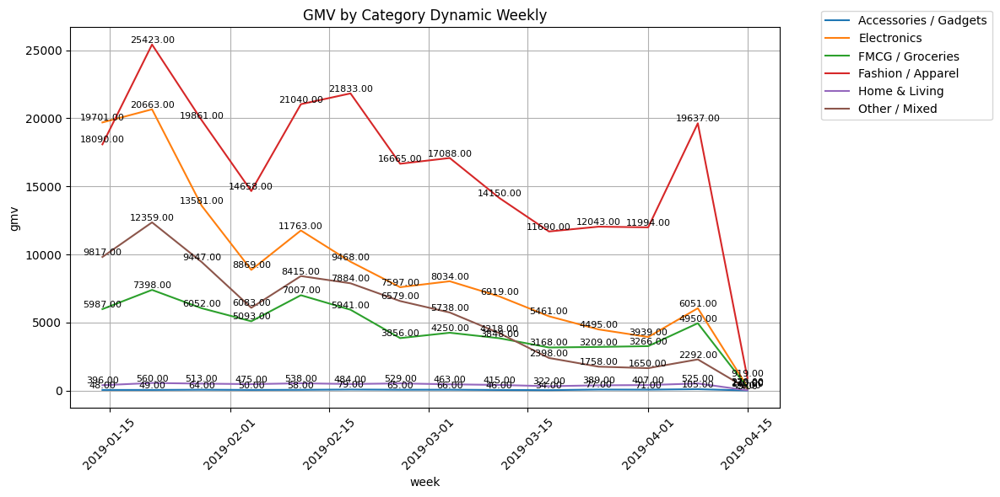

In [29]:
get_category_plot(df_ecom_by_category_by_week, 'week', 'gmv', 'category', 'GMV by Category Dynamic Weekly')

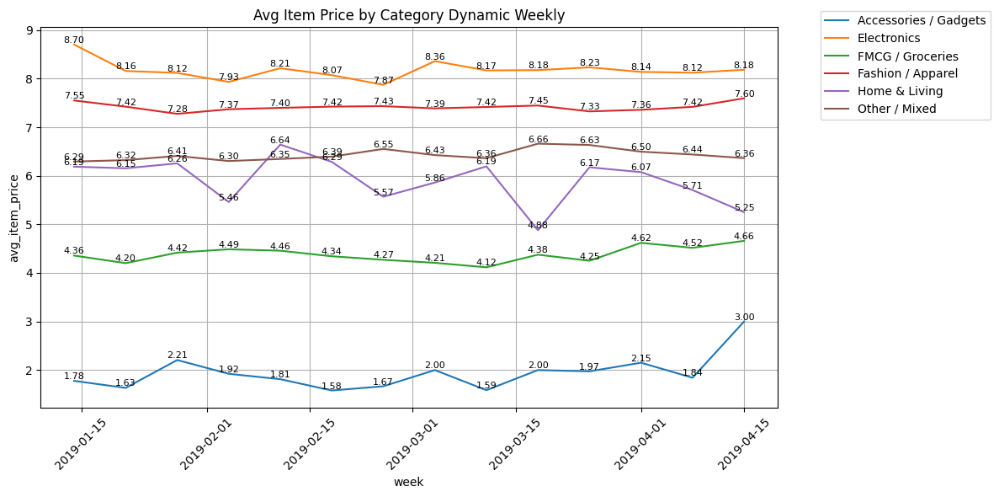

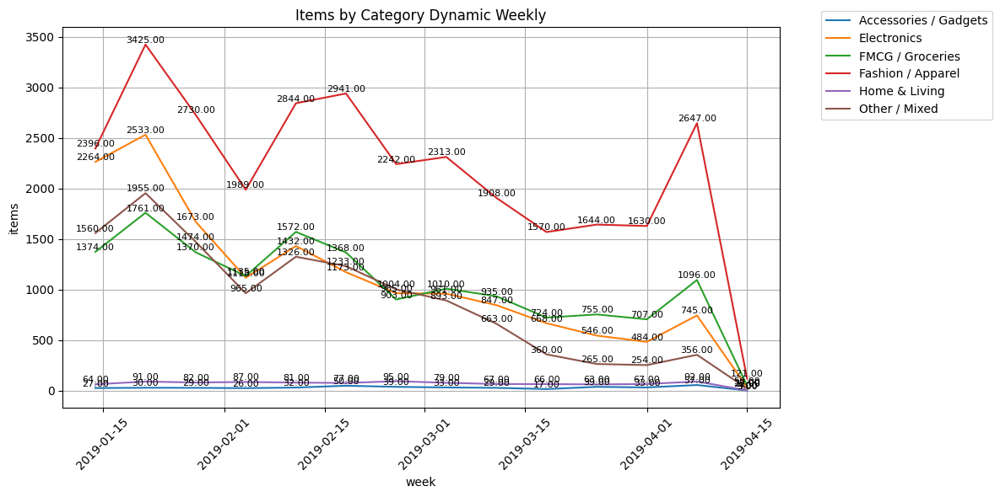

In [30]:
get_category_plot(df_ecom_by_category_by_week, 'week', 'avg_item_price', 'category', 'Avg Item Price by Category Dynamic Weekly')
get_category_plot(df_ecom_by_category_by_week, 'week', 'items', 'category', 'Items by Category Dynamic Weekly')

In [31]:
sum(df_ecom_by_category_by_week[df_ecom_by_category_by_week['week'] == pd.Timestamp(2019, 2, 4)].avg_item_price \
    * df_ecom_by_category_by_week[df_ecom_by_category_by_week['week'] == pd.Timestamp(2019, 2, 4)]['items'])

35228.0

In [32]:
df_ecom_by_category_by_week[df_ecom_by_category_by_week['week'] == pd.Timestamp(2019, 2, 4)].gmv.sum()

35228.0

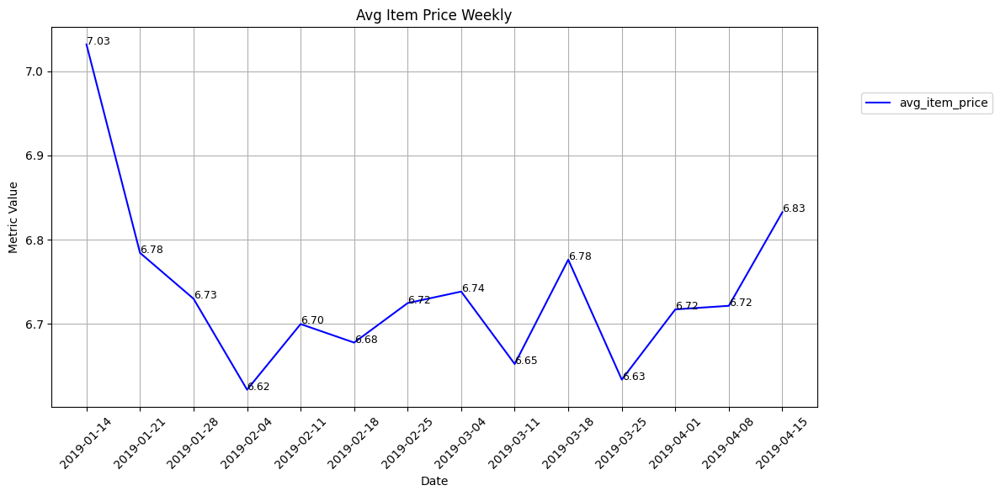

In [33]:
get_line_plot(df_ecom_by_week, 'week', ['avg_item_price'], 'Avg Item Price Weekly', annotate=True)

In [34]:
df_ecom_by_category_by_week['gmv_weekly'] = df_ecom_by_category_by_week.groupby('week').gmv.transform(sum)
df_ecom_by_category_by_week['items_weekly'] = df_ecom_by_category_by_week.groupby('week').items.transform(sum)

In [35]:
df_ecom_by_category_by_week['cat_share_gmv'] = df_ecom_by_category_by_week.gmv / df_ecom_by_category_by_week.gmv_weekly
df_ecom_by_category_by_week['cat_share_items'] = df_ecom_by_category_by_week['items'] / df_ecom_by_category_by_week.items_weekly

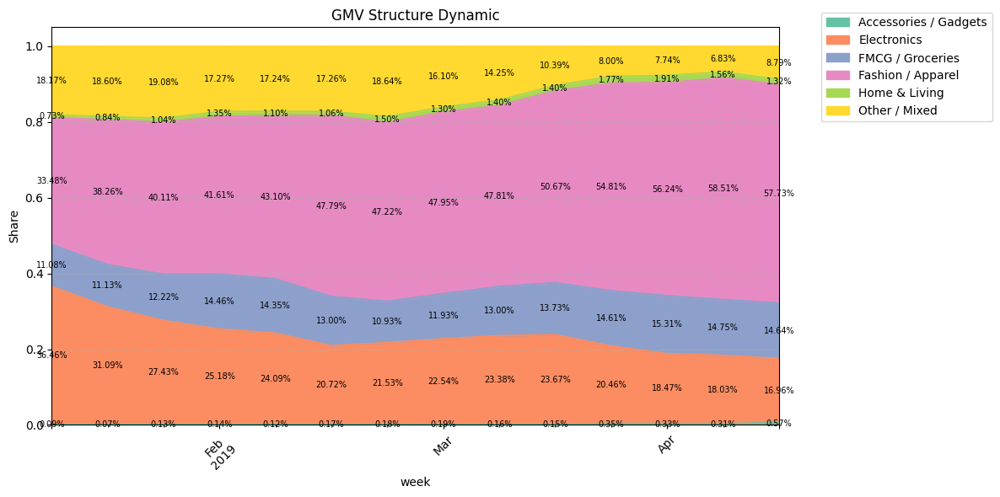

In [36]:
get_stacked_area_plot(df_ecom_by_category_by_week, 'week', 'cat_share_gmv', 'category', 'GMV Structure Dynamic')

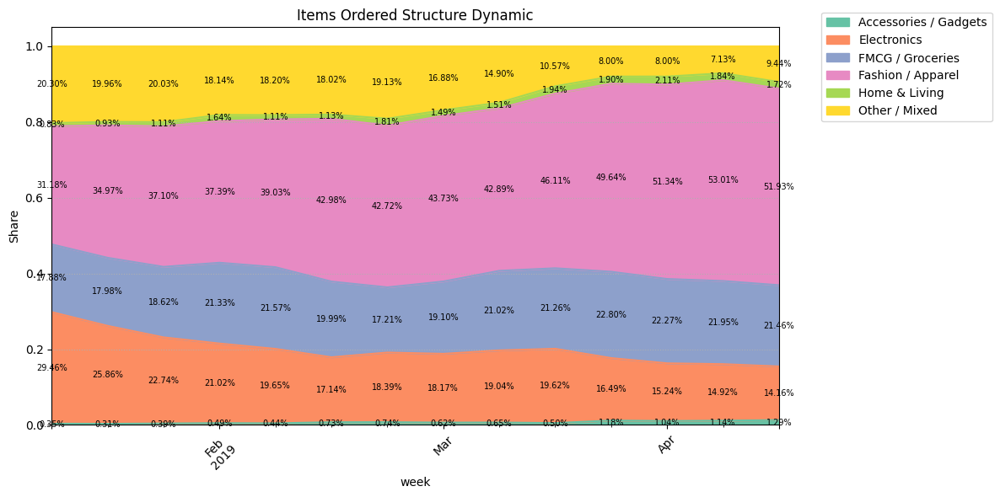

In [37]:
get_stacked_area_plot(df_ecom_by_category_by_week, 'week', 'cat_share_items', 'category', 'Items Ordered Structure Dynamic')

#### Парадокс Симпсона
Ситуация, при которой метрика, посчитанная по всем наблюдениям, ведет себя противоположно тенденции этой же метрики внутри каждой из групп. Парадокс вызван изменением структуры долей групп в общем составе.

Для оценки изменения среднего, рассчитанного по всем значениям группы, мы можем использовать ту же формулу декомпозиции, но уже разложив эффекты на изменение от внутригруппового среднего и доли группы в общем объеме.

Пусть Avg Item Price это AIP, а P — доля конкретной категории, тогда: 

$$
AIP_{t+1}
= AIP_t
\;+\; \sum_{i=1}^n \Delta AIP_i \cdot P_{i,t}
\;+\; \sum_{i=1}^n \Delta P_i \cdot AIP_{i,t}
\;+\; \sum_{i=1}^n \Delta AIP_i \cdot \Delta P_i
$$

In [38]:
df_ecom_by_category_by_month = pd.read_csv('data/df_ecom_by_category_by_month.csv')

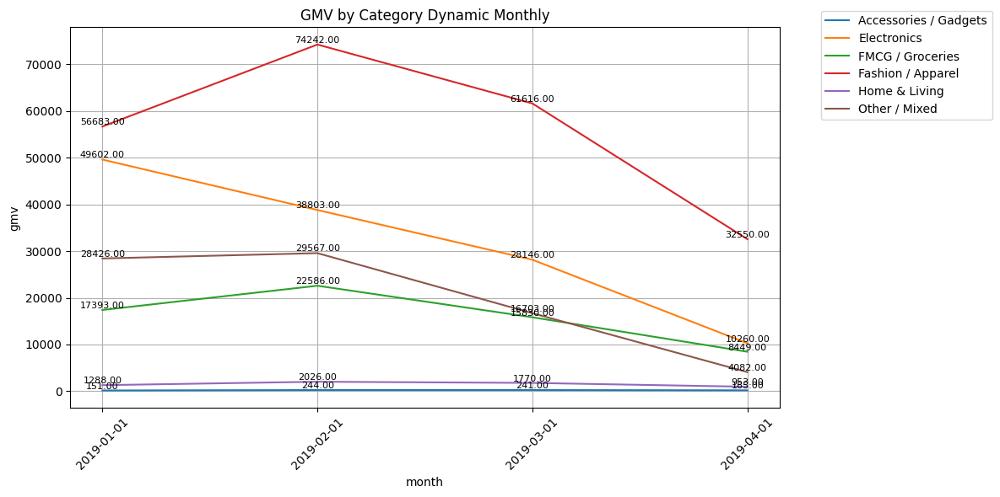

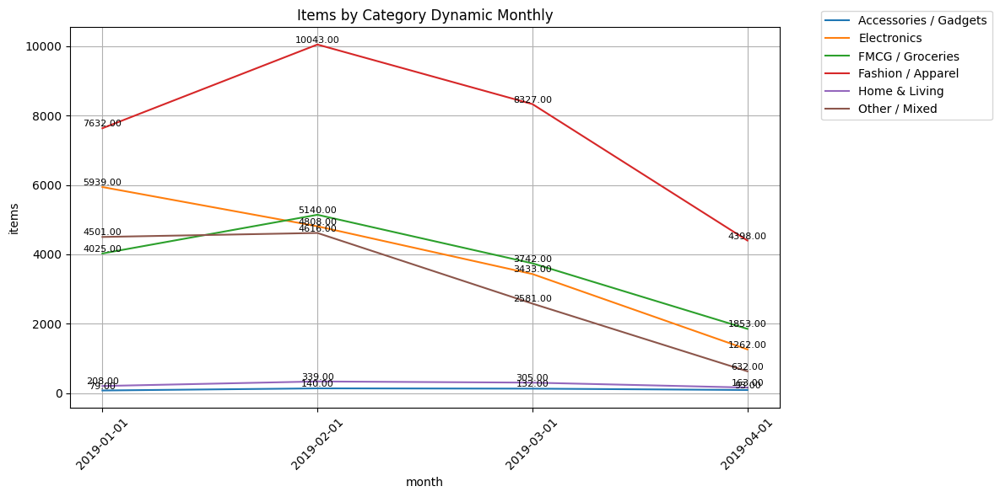

In [39]:
get_category_plot(df_ecom_by_category_by_month, 'month', 'gmv', 'category', 'GMV by Category Dynamic Monthly')
get_category_plot(df_ecom_by_category_by_month, 'month', 'items', 'category', 'Items by Category Dynamic Monthly')

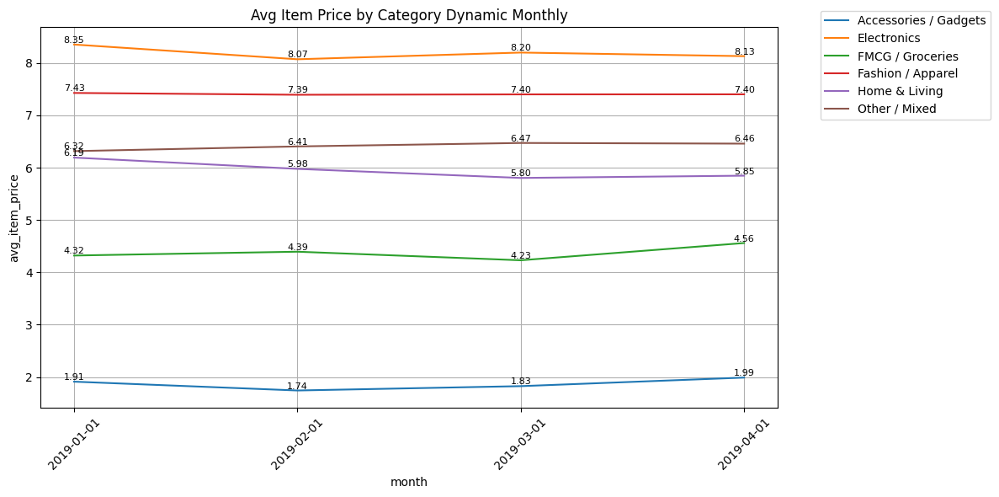

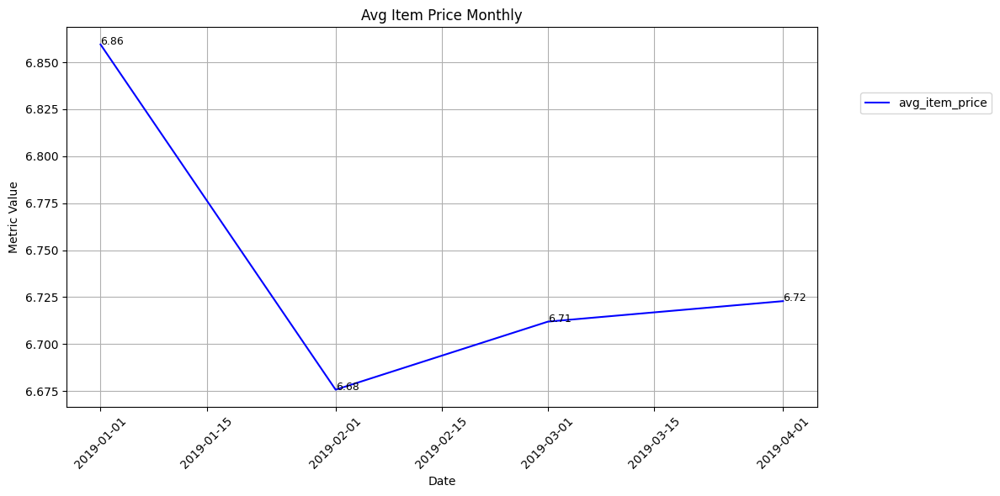

In [40]:
get_category_plot(df_ecom_by_category_by_month, 'month', 'avg_item_price', 'category', 'Avg Item Price by Category Dynamic Monthly')
get_line_plot(df_ecom_by_month, 'month', ['avg_item_price'], 'Avg Item Price Monthly', annotate=True)

In [41]:
df_ecom_by_category_by_month['gmv_monthly'] = df_ecom_by_category_by_month.groupby('month').gmv.transform(sum)
df_ecom_by_category_by_month['items_monthly'] = df_ecom_by_category_by_month.groupby('month').items.transform(sum)

In [42]:
df_ecom_by_category_by_month['cat_share_gmv'] = df_ecom_by_category_by_month.gmv / df_ecom_by_category_by_month.gmv_monthly
df_ecom_by_category_by_month['cat_share_items'] = df_ecom_by_category_by_month['items'] / df_ecom_by_category_by_month.items_monthly

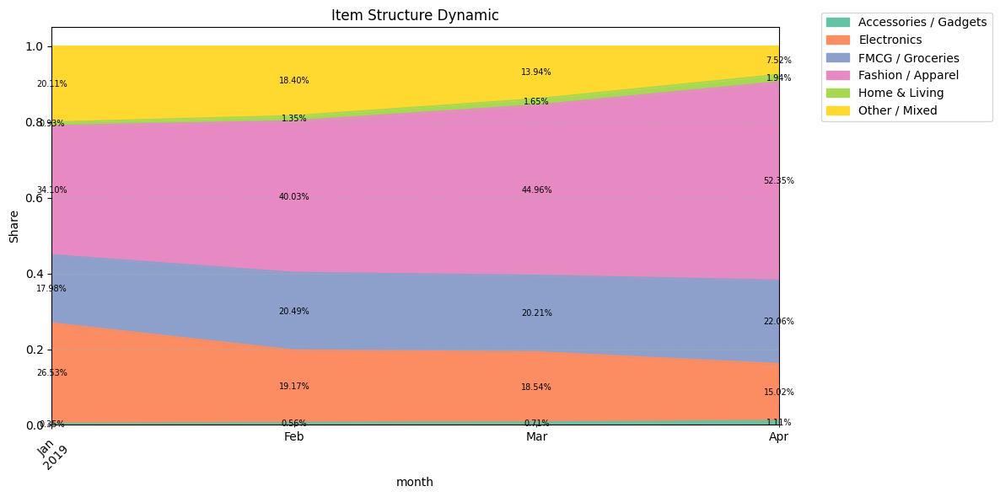

In [43]:
get_stacked_area_plot(df_ecom_by_category_by_month, 'month', 'cat_share_items', 'category', 'Item Structure Dynamic')

In [44]:
df_ecom_by_category_by_month['avg_item_price_lag'] = (df_ecom_by_category_by_month.groupby('category')['avg_item_price'].shift(1))
df_ecom_by_category_by_month['cat_share_items_lag'] = (df_ecom_by_category_by_month.groupby('category')['cat_share_items'].shift(1))

In [45]:
df_ecom_by_category_by_month['price_delta'] = df_ecom_by_category_by_month.avg_item_price - df_ecom_by_category_by_month.avg_item_price_lag
df_ecom_by_category_by_month['p_delta'] = df_ecom_by_category_by_month.cat_share_items - df_ecom_by_category_by_month.cat_share_items_lag

In [46]:
df_ecom_by_category_by_month['price_contr'] = df_ecom_by_category_by_month.price_delta * df_ecom_by_category_by_month.cat_share_items_lag
df_ecom_by_category_by_month['p_contr'] = df_ecom_by_category_by_month.p_delta * df_ecom_by_category_by_month.avg_item_price_lag
df_ecom_by_category_by_month['price_x_p_contr'] = df_ecom_by_category_by_month.p_delta * df_ecom_by_category_by_month.price_delta

In [47]:
df_ecom_by_category_by_month['month'] = pd.to_datetime(df_ecom_by_category_by_month['month']) 

In [48]:
period = pd.Timestamp(2019, 2, 1)

df_ecom_by_category_period = df_ecom_by_category_by_month[df_ecom_by_category_by_month['month'] == period]

avg_price_lag = round(sum(df_ecom_by_category_period.avg_item_price_lag * df_ecom_by_category_period.cat_share_items_lag), 2)
price_contrib = round(sum(df_ecom_by_category_period.price_contr), 2)
p_contrib = round(sum(df_ecom_by_category_period.p_contr), 2)
interaction_contrib = round(sum(df_ecom_by_category_period.price_x_p_contr), 2)
avg_price_curr = round(avg_price_lag + price_contrib + p_contrib + interaction_contrib, 2)

In [49]:
fig = go.Figure(go.Waterfall(
    name = 'Avg Item Price decomposition',
    orientation = 'v',
    measure = ['absolute', 'relative', 'relative', 'relative', 'total'],
    x = ['Avg Item Price prev', 'Item Price effect', 'Category Share effect', 'Interaction', 'Avg Item Price curr'],
    textposition = 'outside',
    text = [avg_price_lag, price_contrib, p_contrib, interaction_contrib, avg_price_curr],
    y = [avg_price_lag, price_contrib, p_contrib, interaction_contrib, avg_price_curr],
    connector = {'line':{'color':'rgb(63, 63, 63)'}}
))

fig.update_layout(title='Waterfall decomposition of Avg Item Price (MoM)')
fig.show()

**Напоследок — старая добрая математика**

Для метрик-долей и конверсий всегда полезно отдельно смотреть на числитель и знаменатель.  
На практике этот приём срабатывает чаще, чем хотелось бы: падение конверсии может быть вызвано не только снижением числа успешных действий (числителя), но и ростом базы (знаменателя).  

Например, падение Ride Completion Rate (CR из заказа в завершенную поездку в такси) может быть вызвано ростом числа перезаказов из-за ошибок в приложении.

### Порешаем

In [50]:
df = pd.read_csv('data/seminar_1_taxi.csv')
df.head()

,order_id,date,city,platform,status,eta,driver_cancellation_reason,reason_for_cancelling_by_customer,rta
0,1,2025-06-07,new_york,ios,Completed,5.18,NaN,NaN,6.91
1,2,2025-06-06,new_york,ios,Completed,6.01,NaN,NaN,7.32
2,3,2025-06-07,new_york,ios,Completed,6.89,NaN,NaN,9.75
3,4,2025-06-02,new_york,ios,Completed,5.45,NaN,NaN,8.01
4,5,2025-06-03,new_york,ios,Completed,5.04,NaN,NaN,6.42


In [51]:
df['has_ride'] = df.status == 'Completed'

In [52]:
df_ny_agg = df[df['city'] == 'new_york'].groupby(['date'], as_index=False) \
    .agg(orders=('order_id', 'nunique'),
         rides=('has_ride', 'sum'))

In [53]:
df_ny_agg['ride_completion_rate'] = df_ny_agg.rides / df_ny_agg.orders

<Axes: title={'center': 'New York Ride Completion Rate'}, xlabel='date'>

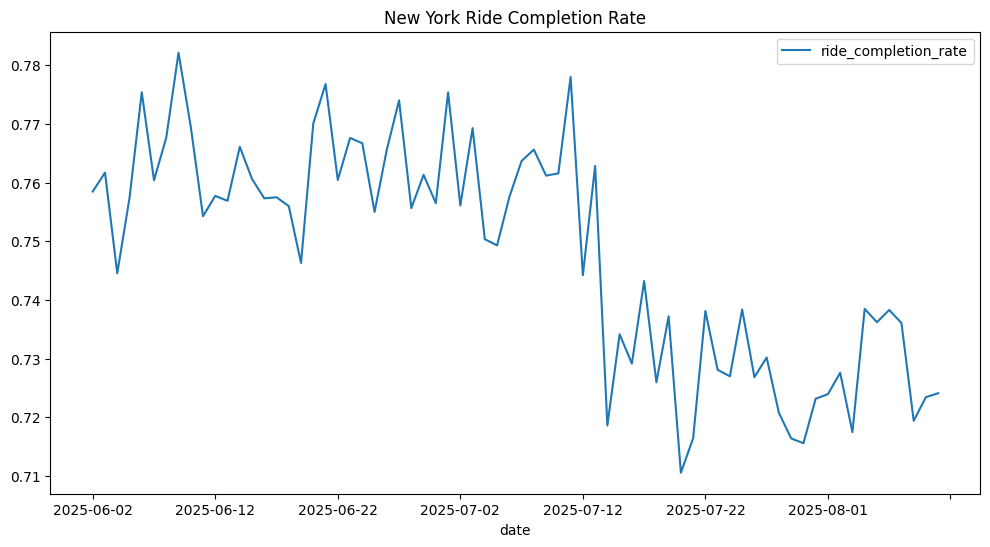

In [54]:
df_ny_agg.plot(figsize=(12,6), x='date', y='ride_completion_rate', title='New York Ride Completion Rate')

In [55]:
df.city.unique()

array(['new_york', 'chicago', 'san_francisco', 'austin', 'miami'],
      dtype=object)

In [56]:
df_agg_by_city = df.groupby(['date', 'city'], as_index=False) \
    .agg(orders=('order_id', 'nunique'),
         rides=('has_ride', 'sum'))

df_agg_all_cities = df.groupby(['date'], as_index=False) \
    .agg(orders=('order_id', 'nunique'),
         rides=('has_ride', 'sum'))

In [57]:
df_agg_by_city['ride_completion_rate'] = df_agg_by_city.rides / df_agg_by_city.orders
df_agg_all_cities['ride_completion_rate'] = df_agg_all_cities.rides / df_agg_all_cities.orders

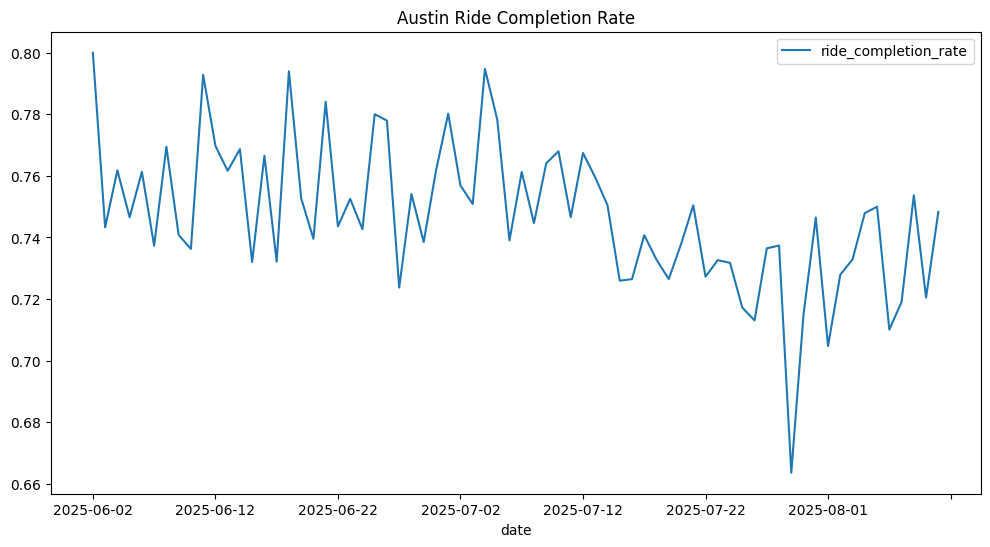

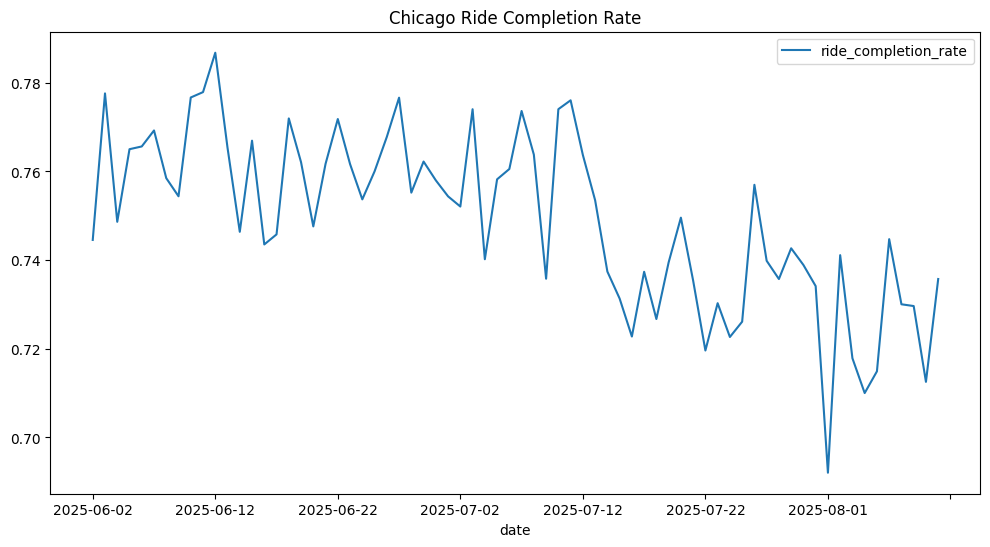

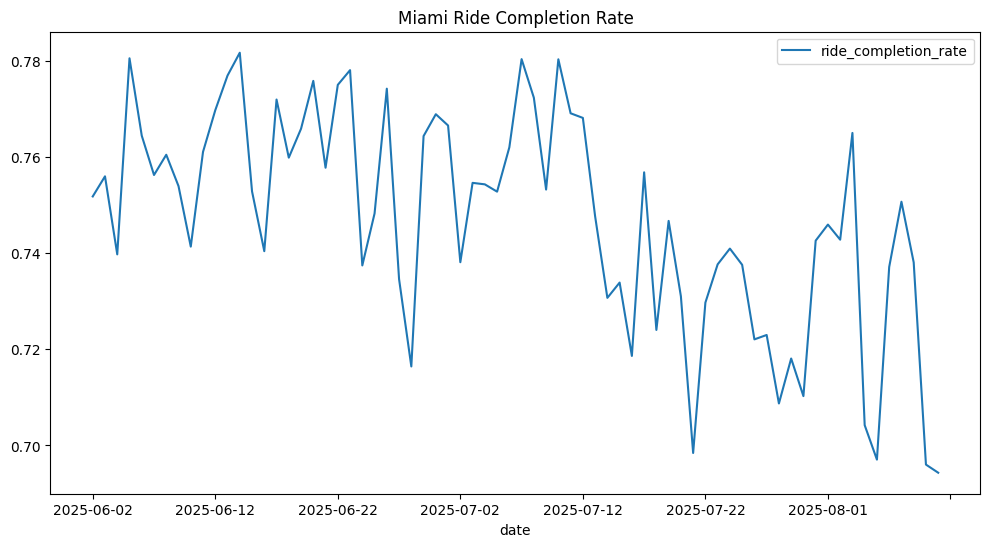

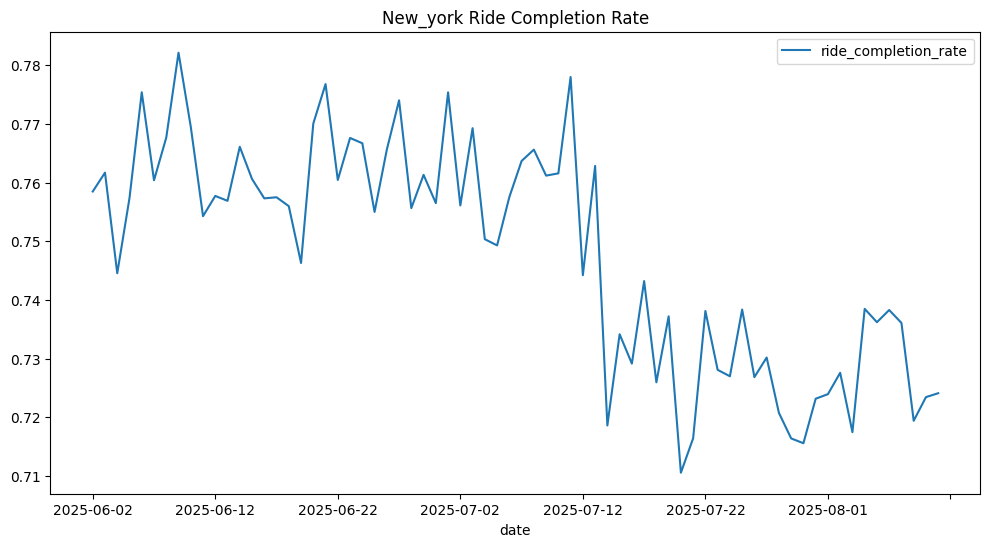

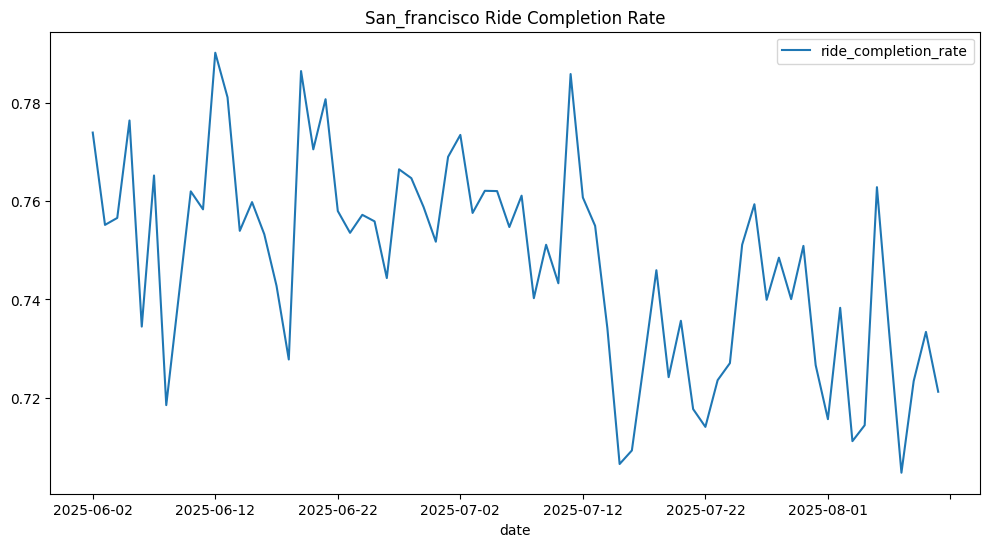

In [58]:
for c in df_agg_by_city.city.unique():
    df_agg_by_city[df_agg_by_city['city'] == c] \
    .plot(figsize=(12,6), x='date', y='ride_completion_rate', title=f'{c.capitalize()} Ride Completion Rate')

<Axes: title={'center': 'Ride Completion Rate'}, xlabel='date'>

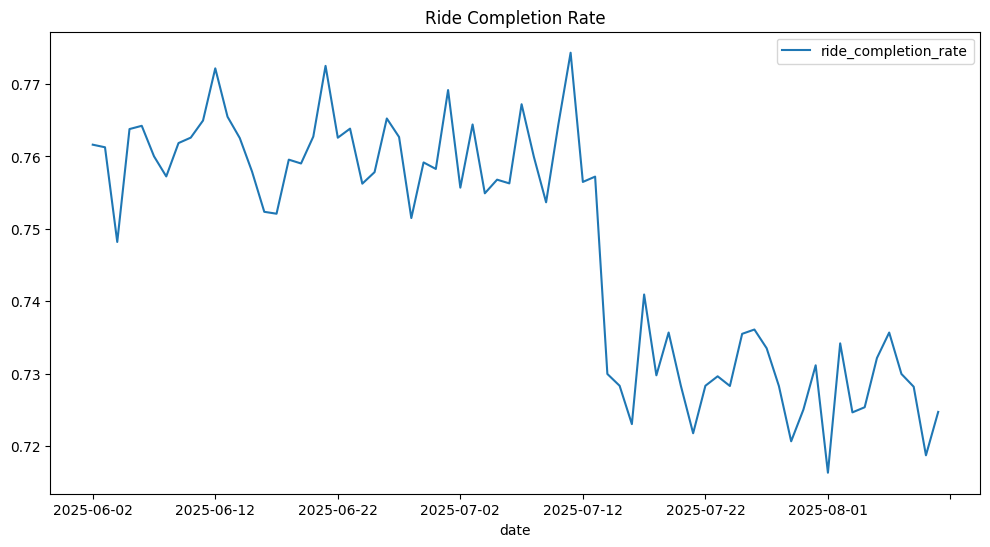

In [59]:
df_agg_all_cities.plot(figsize=(12,6), x='date', y='ride_completion_rate', title='Ride Completion Rate')

**Вывод:** падение Ride Completion Rate происходит на уровне всей страны / региона

In [60]:
df.status.unique()

array(['Completed', 'No Driver Found', 'Cancelled by Driver',
       'Cancelled by Customer', 'Incomplete'], dtype=object)

In [61]:
df['has_accept'] = df.status != 'No Driver Found'
df['has_cancellation'] = df.status.isin(['Cancelled by Customer', 'Cancelled by Driver'])
df['has_incompletion'] = df.status == 'Incomplete'

In [62]:
df_agg_all_cities = df.groupby(['date'], as_index=False) \
    .agg(orders=('order_id', 'nunique'),
         rides=('has_ride', 'sum'),
         accepted=('has_accept', 'sum'),
         cancelled=('has_cancellation', 'sum'),
         incompleted=('has_incompletion', 'sum')
        )

In [63]:
df_agg_all_cities['rcr'] = df_agg_all_cities.rides / df_agg_all_cities.orders
df_agg_all_cities['ar'] = df_agg_all_cities.accepted / df_agg_all_cities.orders
df_agg_all_cities['cr'] = df_agg_all_cities.cancelled / df_agg_all_cities.orders
df_agg_all_cities['icr'] = df_agg_all_cities.incompleted / df_agg_all_cities.orders

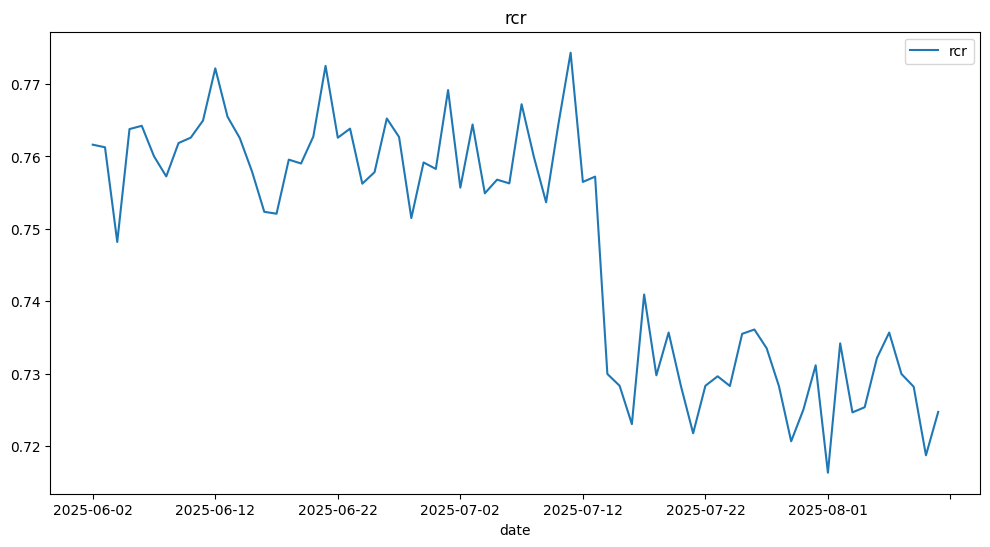

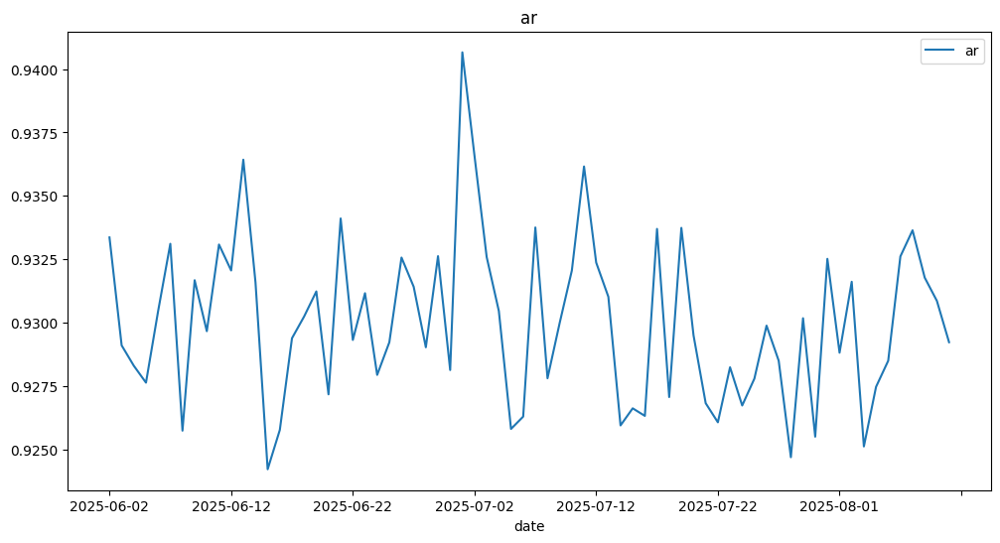

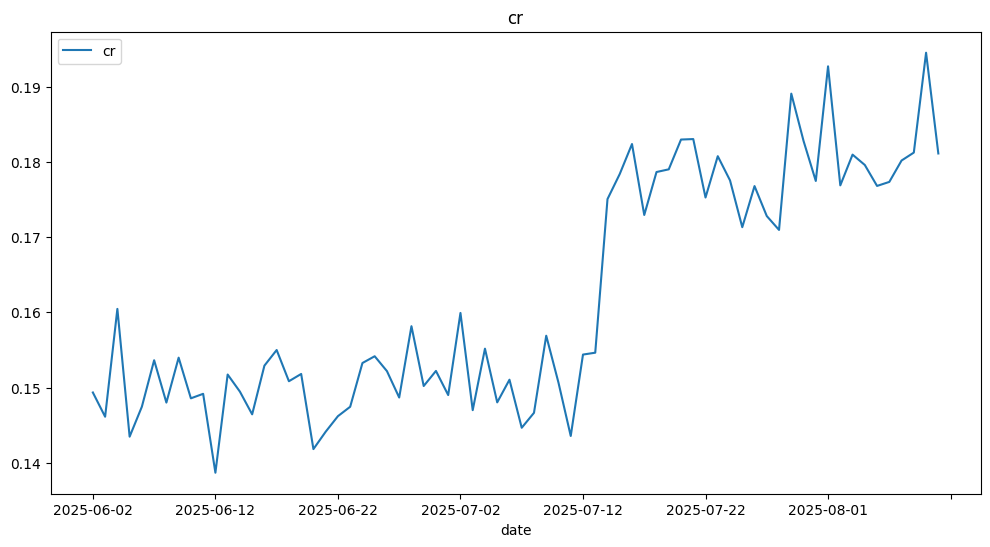

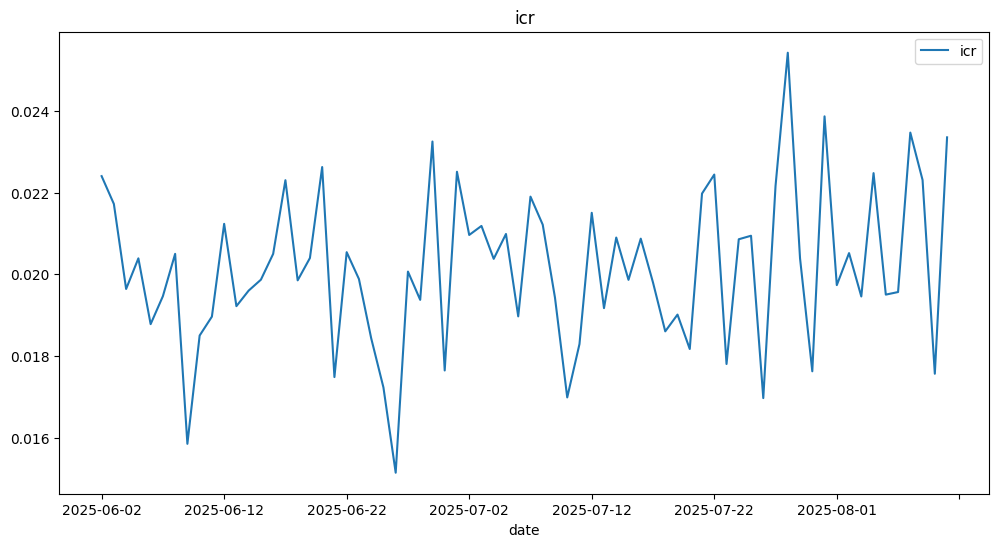

In [64]:
for metric in ['rcr', 'ar', 'cr', 'icr']:
    df_agg_all_cities.plot(figsize=(12,6), x='date', y=metric, title=f'{metric}')

In [65]:
df['cancelled_by_driver'] = df.status == 'Cancelled by Driver'
df['cancelled_by_pass'] = df.status == 'Cancelled by Customer'

In [66]:
df_agg_all_cities = df.groupby(['date'], as_index=False) \
    .agg(orders=('order_id', 'nunique'),
         rides=('has_ride', 'sum'),
         accepted=('has_accept', 'sum'),
         cancelled=('has_cancellation', 'sum'),
         incompleted=('has_incompletion', 'sum'),
         cancelled_by_driver=('cancelled_by_driver', 'sum'),
         cancelled_by_pass=('cancelled_by_pass', 'sum'),
         avg_eta=('eta', 'mean')
        )

In [67]:
df_agg_all_cities['cancelled_by_driver_share'] = df_agg_all_cities.cancelled_by_driver / df_agg_all_cities.cancelled
df_agg_all_cities['cancelled_by_pass_share'] = df_agg_all_cities.cancelled_by_pass / df_agg_all_cities.cancelled

<Axes: title={'center': 'cancelled_by_pass_share'}, xlabel='date'>

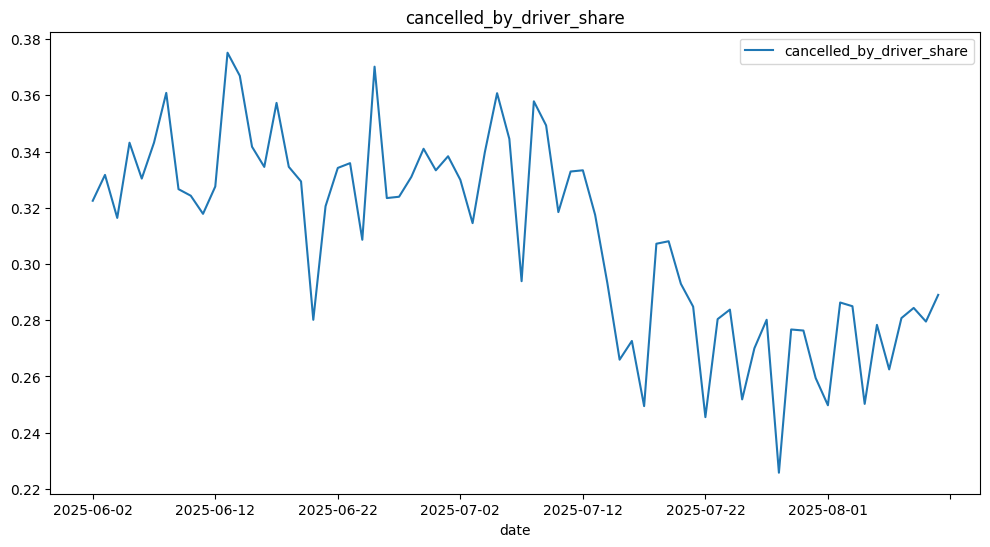

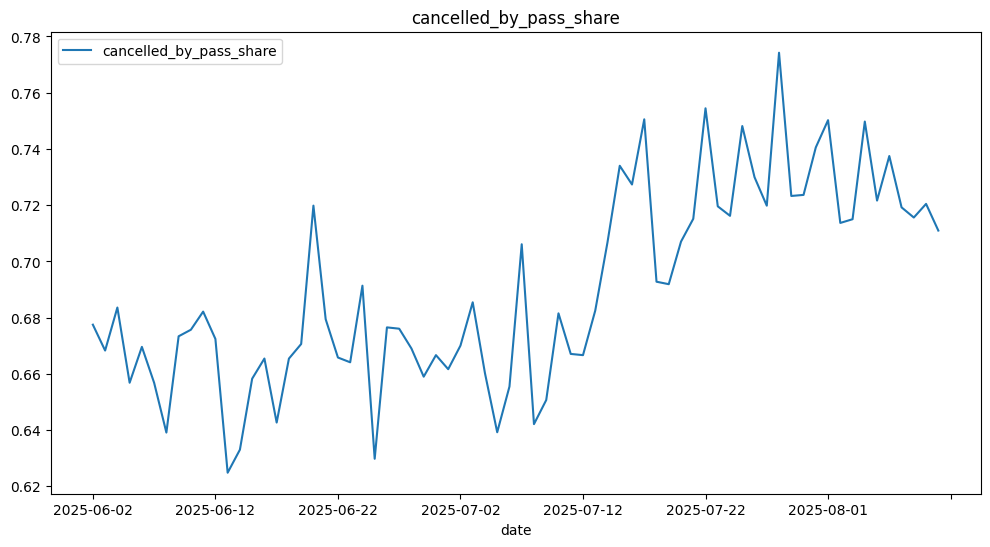

In [68]:
df_agg_all_cities.plot(figsize=(12,6), x='date', y='cancelled_by_driver_share', title=f'cancelled_by_driver_share')
df_agg_all_cities.plot(figsize=(12,6), x='date', y='cancelled_by_pass_share', title=f'cancelled_by_pass_share')

<Axes: title={'center': 'cancelled_by_pass'}, xlabel='date'>

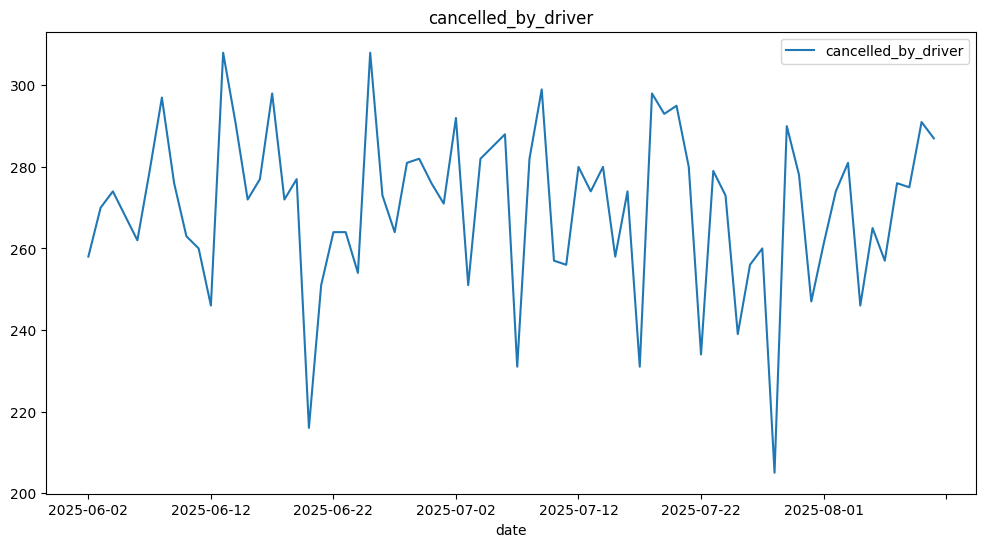

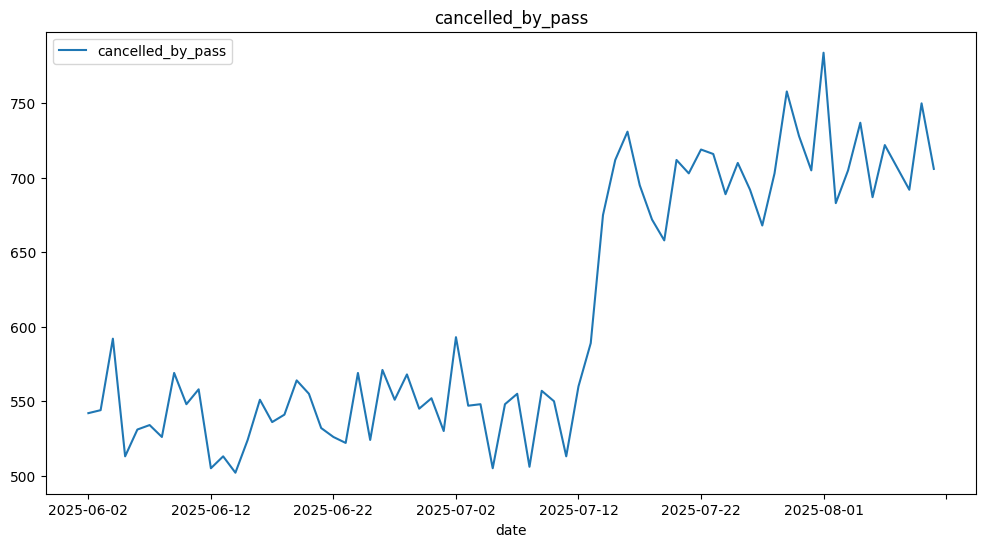

In [69]:
df_agg_all_cities.plot(figsize=(12,6), x='date', y='cancelled_by_driver', title=f'cancelled_by_driver')
df_agg_all_cities.plot(figsize=(12,6), x='date', y='cancelled_by_pass', title=f'cancelled_by_pass')

In [70]:
df[df['status'] == 'Cancelled by Customer'].reason_for_cancelling_by_customer.unique()

array(['Wrong Address', 'Driver is not moving towards pickup location',
       'AC is not working', 'Change of plans', 'Driver asked to cancel',
       'Too long waiting time'], dtype=object)

In [71]:
df[df['status'] == 'Cancelled by Driver'].driver_cancellation_reason.unique()

array(['Customer related issue', 'More than permitted people in there',
       'The customer was coughing/sick', 'Personal & Car related issues'],
      dtype=object)

In [72]:
df_cancellations_by_pass_reasons = df[df['cancelled_by_pass']].groupby(['date', 'reason_for_cancelling_by_customer'], as_index=False) \
    .agg(orders=('order_id', 'nunique')
        )

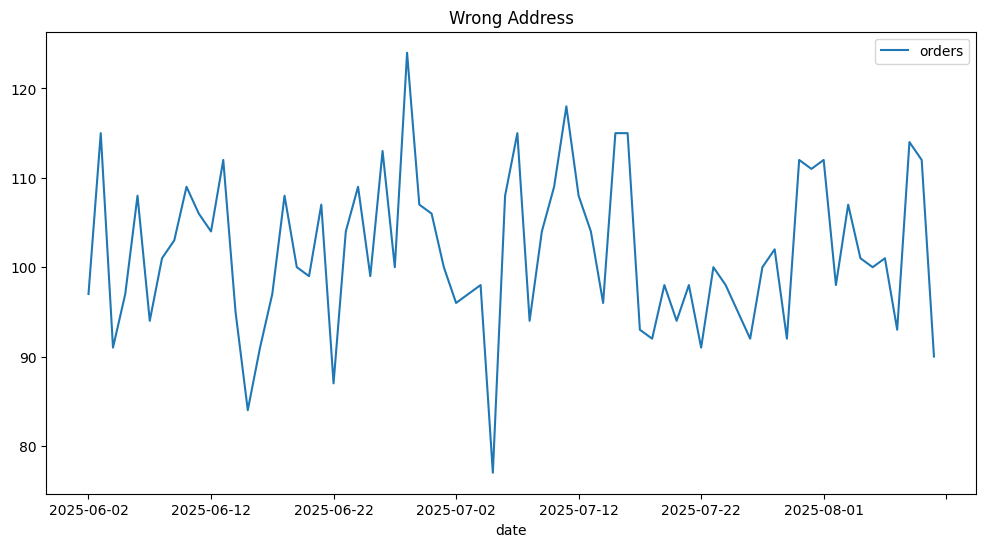

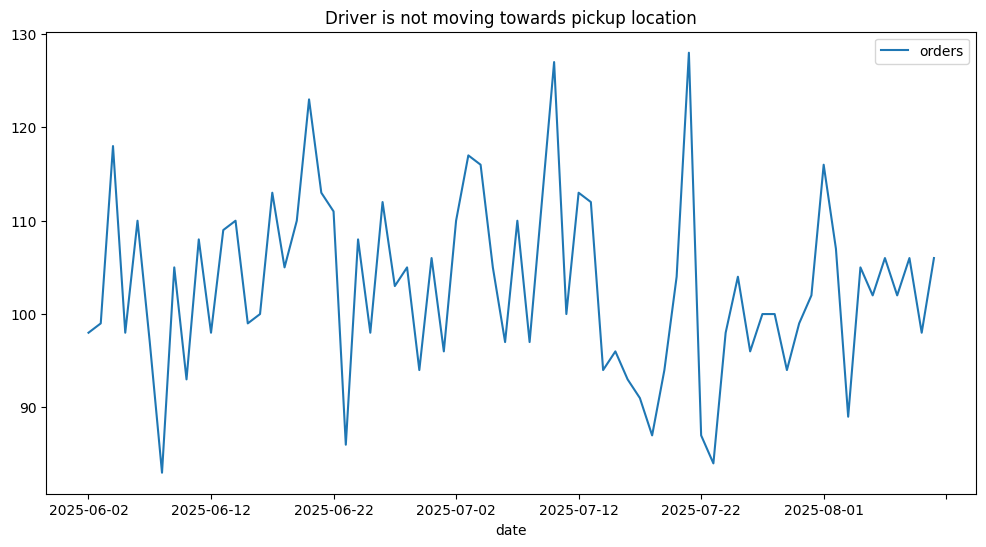

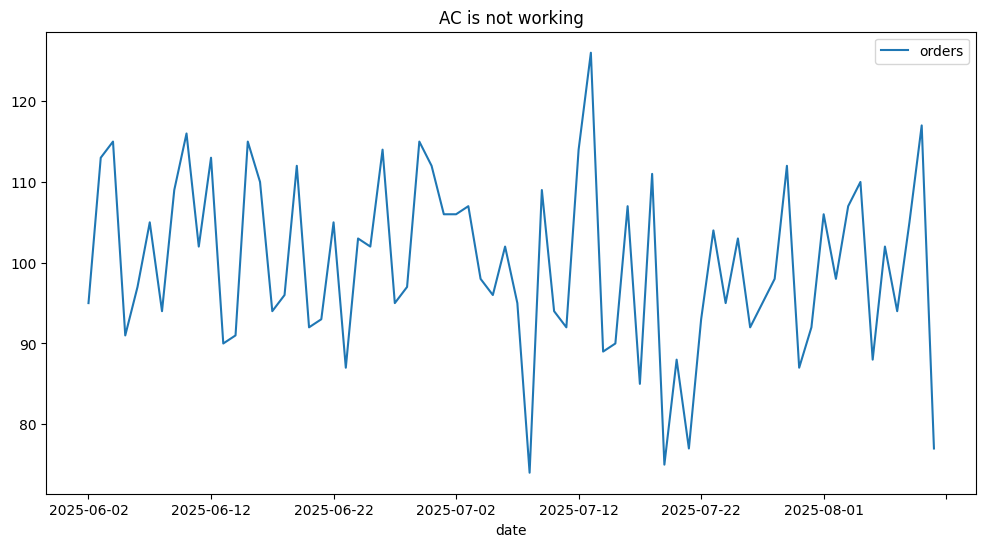

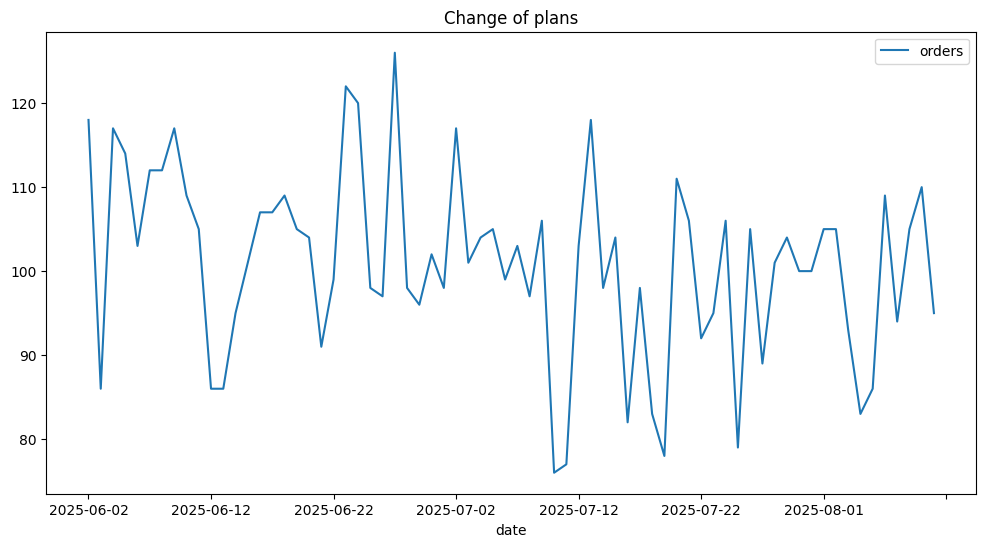

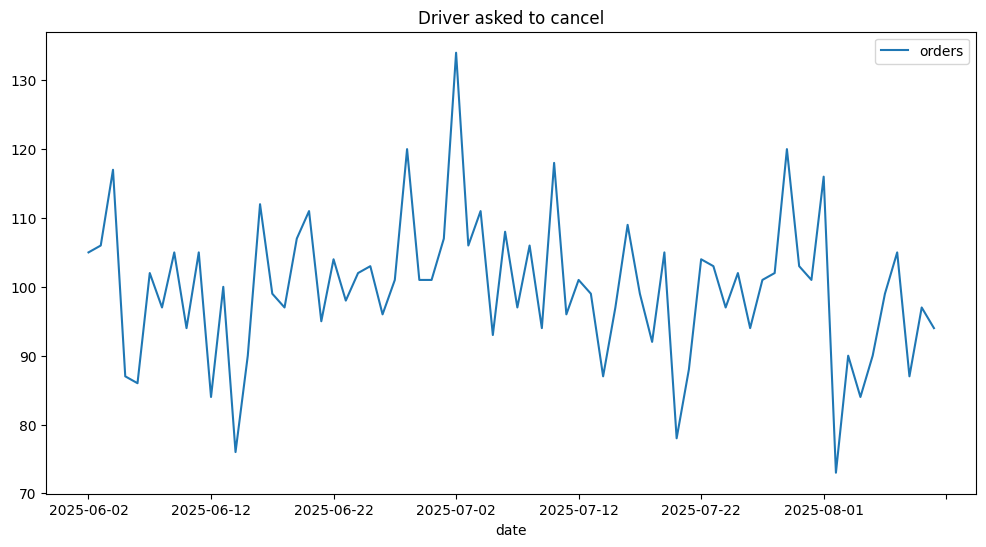

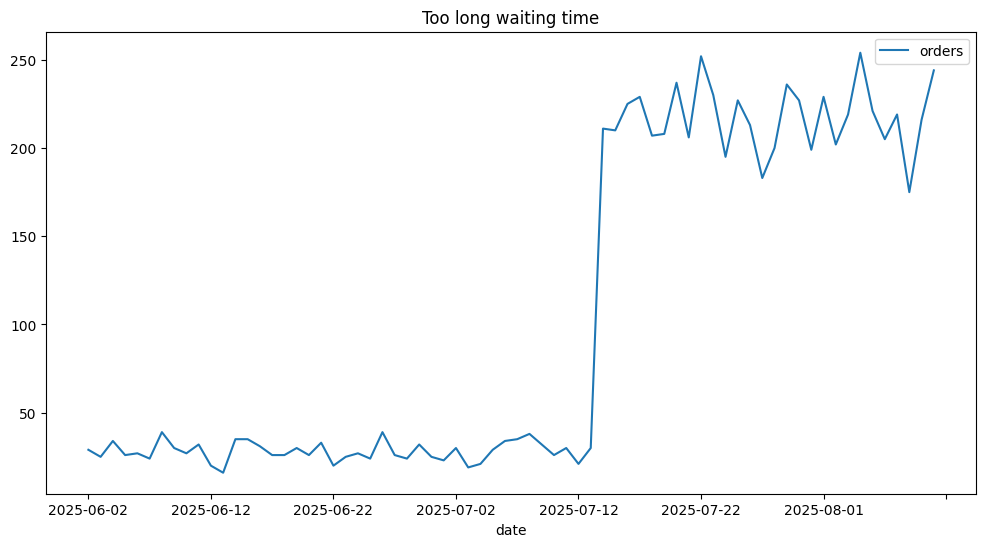

In [73]:
for reason in ['Wrong Address', 'Driver is not moving towards pickup location',
               'AC is not working', 'Change of plans', 'Driver asked to cancel',
               'Too long waiting time']:
    
    df_cancellations_by_pass_reasons[df_cancellations_by_pass_reasons['reason_for_cancelling_by_customer'] == reason] \
        .plot(figsize=(12,6), x='date', y='orders', title=f'{reason}')

<Axes: title={'center': 'eta'}, xlabel='date'>

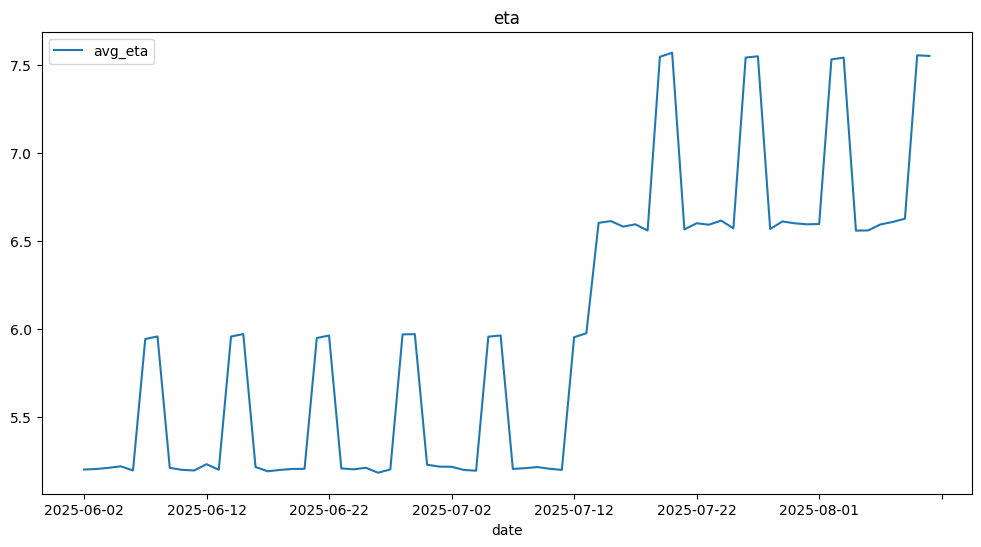

In [74]:
df_agg_all_cities.plot(figsize=(12,6), x='date', y='avg_eta', title=f'eta')

In [76]:
df_agg_by_platform = df.groupby(['date', 'platform'], as_index=False) \
    .agg(avg_eta = ('eta', 'mean'))

<Axes: title={'center': 'avg_eta'}, xlabel='date'>

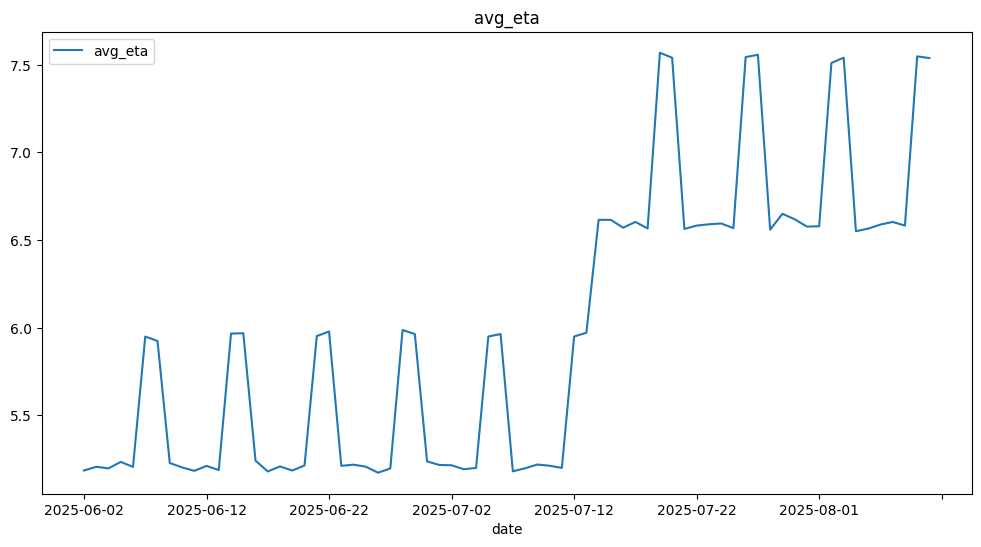

In [77]:
df_agg_by_platform[df_agg_by_platform['platform'] == 'ios'].plot(figsize=(12,6), x='date', y='avg_eta', title=f'avg_eta')

<Axes: title={'center': 'avg_eta'}, xlabel='date'>

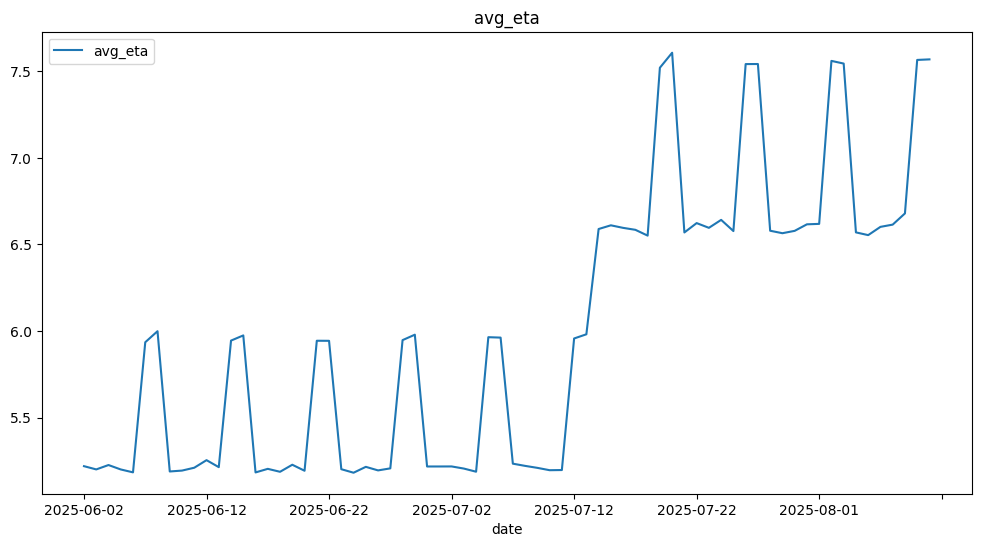

In [78]:
df_agg_by_platform[df_agg_by_platform['platform'] == 'android'].plot(figsize=(12,6), x='date', y='avg_eta', title=f'avg_eta')

In [79]:
df_with_rta = df[~df['rta'].isna()]

df_with_rta['eta_2_rta'] = df_with_rta.eta / df_with_rta.rta

In [80]:
df_temp = df_with_rta.groupby(['date'], as_index=False) \
    .agg(avg_eta_2_rta=('eta_2_rta', 'mean'))

<Axes: title={'center': 'avg_eta_2_rta'}, xlabel='date'>

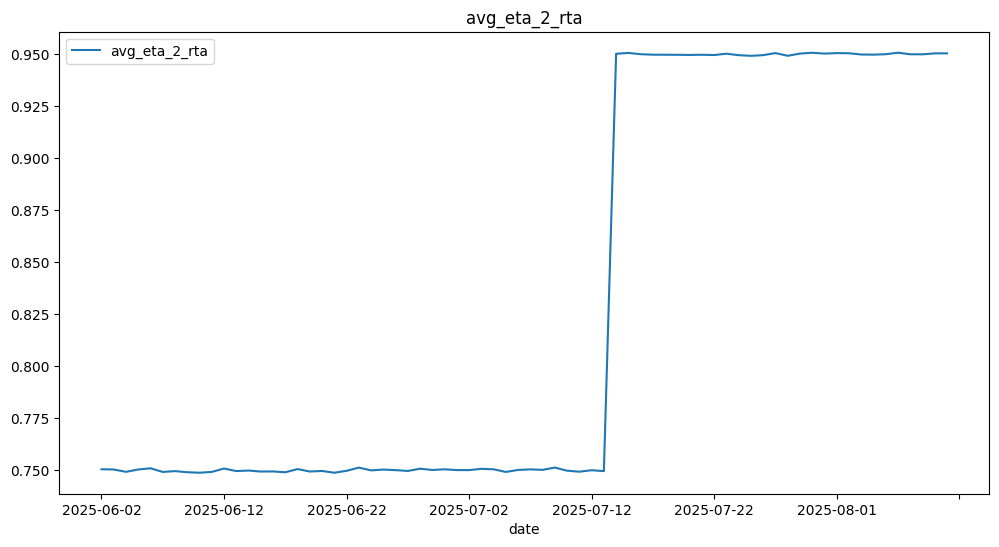

In [81]:
df_temp.plot(figsize=(12,6), x='date', y='avg_eta_2_rta', title=f'avg_eta_2_rta')